In [1]:
import numpy as np
from matplotlib import pyplot as plt
from scipy.io import wavfile
from scipy.signal import decimate
from comp28512_utils import Audio
from numpy import fft
from scipy.fftpack import dct
from scipy.fftpack import dct, idct
from tempfile import TemporaryFile as tf

def plotme(x,y,labelX,labelY,graphName):
    plt.plot(x,y)
    plt.title(graphName)
    plt.xlabel(labelX)
    plt.ylabel(labelY)
    plt.show()
    
    
def sin(Fs, f, harmonics):
    T = 1.0/Fs
    x = np.arange(500)
    y = np.zeros(500)
    for k in range(1, harmonics):
        if (k%2) == 1:
            y += (1.0 / k) * np.sin(2 * np.pi *  f * k * T * x)
    return y
def cos(Fs, f,harmonics):
    T = 1.0/Fs
    x = np.arange(500)
    y = np.zeros(500)
    for k in range(1, harmonics):
        if (k%2) == 1:
            y += (1.0 / k*k) * np.cos(2 * np.pi *  f * k * T * x)
    return y

def sinPhase(Fs, f,harmonics):
    T = 1.0/Fs
    x = np.arange(500)
    y = np.zeros(500)
    for k in range(1, harmonics):
        if (k%2) == 1:
            if k == 3:
                y += (1.0 / k) * np.sin(2 * np.pi *  f * k * T * x + np.pi / 2)
            else:
                y += (1.0 / k) * np.sin(2 * np.pi *  f * k * T * x)
    return y

def makeFourier(audio, Fs):

    length = len(noise[1:501])
    x = np.arange(1,length+1)
    scaledT = length / float(Fs)
    fourierFrequency = x / scaledT
    Fourier = fft.fft(noise[1:501])
    
    return length, fourierFrequency, Fourier


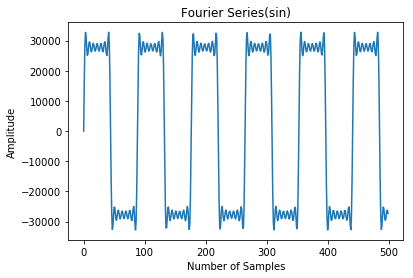

In [2]:
y = np.zeros(500)
x = np.arange(500)
y = sin(44100, 500, 15)
A = np.amax(np.absolute(y))
quant = np.round((y * (2**16 - 1) / 2) / A - 0.5)
intQ = np.int16(quant)
plotme(x,intQ,'Number of Samples','Amplitude','Fourier Series(sin)')

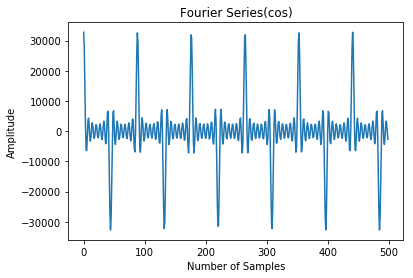

In [3]:
y = np.zeros(500)
x = np.arange(500)
y = cos(44100, 500, 15)
A = np.amax(np.absolute(y))
quant = np.round((y * (2**16 - 1) / 2) / A - 0.5)
intQ = np.int16(quant)
plotme(x,intQ,'Number of Samples','Amplitude','Fourier Series(cos)')

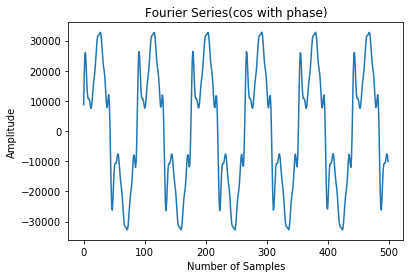

In [4]:
y = np.zeros(500)
x = np.arange(500)
y = sinPhase(44100, 500, 15)
A = np.amax(np.absolute(y))
quant = np.round((y * (2**16 - 1) / 2) / A - 0.5)
intQ = np.int16(quant)
plotme(x,intQ,'Number of Samples','Amplitude','Fourier Series(cos with phase)')

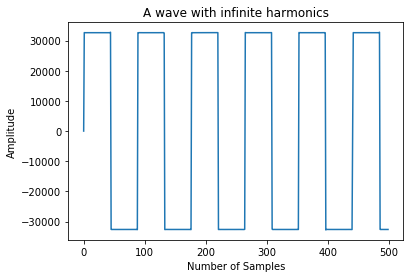

In [5]:
y = np.zeros(500)
x = np.arange(500)
y = sin(44100, 500, 10000)
A = np.amax(np.absolute(y))
quant = np.round((y * (2**16 - 1) / 2) / A - 0.5)
intQ = np.int16(quant)
plotme(x,intQ,'Number of Samples','Amplitude','A wave with infinite harmonics')

#### The first and the third waves are similar in the way that, when the harmonic is equal to three the amplitude is the same for both waveforms

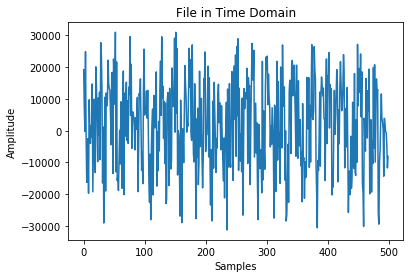

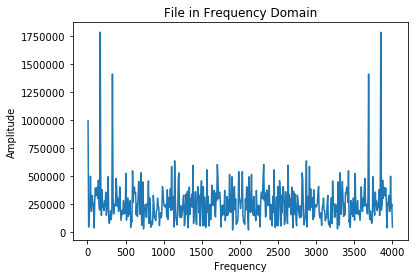

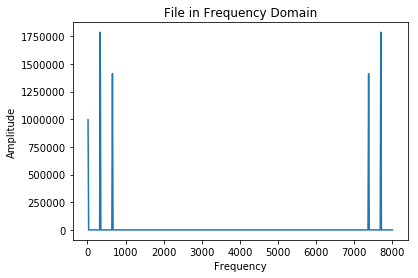

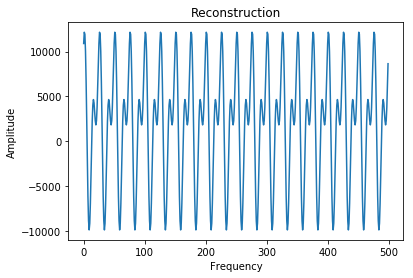

In [6]:
(Fs, noise) = wavfile.read("noisySinewave.wav")

x = np.arange(500)
plotme(x, noise[1:501],'Samples','Amplitude','File in Time Domain')

length,rate,Fourier = makeFourier(noise, Fs)

plotme(rate/2, np.abs(Fourier),'Frequency','Amplitude','File in Frequency Domain')

ModFourier = np.absolute(Fourier);

for i in range(0,500):
    if(ModFourier[i] <= 750000):
        Fourier[i] = 0
    
ModFourier = np.absolute(Fourier);
        
plotme(rate, ModFourier,'Frequency','Amplitude','File in Frequency Domain')

#y = makeInverseFourier(Fourier, length)
y = fft.ifft(Fourier)
y = np.real(y)
#x = np.arange(1,)
plotme(x, y,'Frequency','Amplitude','Reconstruction')

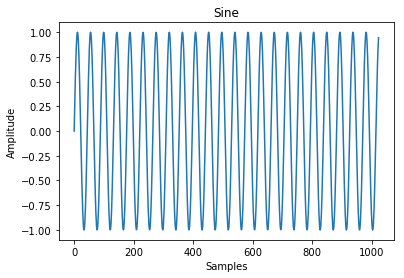

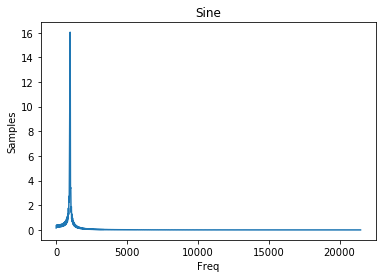

Data written to /tmp/comp28512_1okwBF.wav.


<source src="data:audio/wav;base64,UklGRiSgDwBXQVZFZm10IBAAAAABAAEARKwAAIhYAQACABAAZGF0YQCgDwDM/Rz+0P0T/gL+z/3v
/WT+Vf48/iL+Uv4L/vv9Vv4v/m/+qP6x/sX+pP6N/kH+7/3b/ZH9oP2v/a/99v3P/e39KP4k/kH+
ef6N/lH+Df7g/XP9av2Z/e/9M/5p/kD+tf2Q/bT95/1R/qj+kP5G/sL9T/1h/eH9LP40/ij+6P3J
/WD9H/0o/Tv9gf3E/fr99f0H/pL9ufy4/OD8Of25/RD+KP4N/vb9z/32/Wn+2v7a/hz/Kf8Z/+z+
v/61/uv+GP///sL+dP43/hD+0/31/XT+pf7D/pr+Q/4D/sX9hv2N/dL9Qv5X/kD+M/43/gz+2v05
/oT+6v5A/2r/XP8y/9j+d/5Z/iP+eP7p/hj/TP9M//T+qf5y/if+Jv5Q/l3+X/5R/mn+K/6Q/Sf9
LP1r/cX94/3e/bX9RP1Q/ZL9xP0L/lD+qP6z/nP+hf5O/lv+G/7O/c79OP6M/n/+V/5b/j3+Xv43
/gn+3P2s/bT9nf1e/ZD9kv2e/Xj9NP34/O/8Ev1n/Q7+K/5C/jj+H/4y/kH+Sf5H/jr+Tv53/pv+
n/6a/pP+W/5B/lv+Kv4K/uv9qf2e/V399fz+/O382fzn/AT9+/zQ/Nv86/zQ/Pn8Ov1H/Sr9N/0p
/R79Xv1u/bb90f2A/W39n/0Q/mb+kP6B/jH+AP7M/ZD9+P0t/ir+9v24/UX9Uf1z/Vz9Ov36/Lb8
Y/xD/IT86/xb/ar9u/3o/ZP9HP2E/az9nf2O/Z/9qv12/XP9dP24/ev9nP2P/bj96f3O/Y79N/0G
/Tn9Wv00/QH90vyg/Hb8SPxd/Jb8vPyH/JT8r/xq/J78u/zF/Kr8kfyG/FL8U/wr/PX7K/xc/Jz8
Bf2R/dD9k/1b/Sv9Av3n/Ab9ef2Q/af9uP1d/TT9H/1A/bX9uP0E/if+Lf4N/p/9mf3a/bX9xf3O
/ZH9nP34/Wn+k/6O/p3+av6M/q/+tv71/iT/BP+a/lv+RP5D/k3+f/52/mP+Wv4Q/vj93v2Z/Zz9
rv0E/lv+Hf70/bT9df1Y/WH94f1n/pH+j/5A/gL+9v3S/fT9Nv6P/vT+Av/O/r/+nP5O/iv+OP6B
/pz+hf5e/jX+NP4a/jf+T/5P/mn+af5B/oD+Wv43/gP+J/5Z/s7+HP/O/pz+gf6e/tP+ZP8YAHEA
WAC3/zH/nP6o/ib/ff8mAFgA5/8C/zT+Dv5l/ub+df/J/+b/fv/N/h3++f1k/nb+pf7p/h7/Qv/z
/sj+wv64/ij/j/9CAKMAcwDb/zT/Jv/3/ub+UP9q/43/mP9b/wX/GP9L/1j/Qf8k/9z+9P7f/pr+
nv6z/sP+z/6i/pD+jf6O/q3+p/4m/4L/nP90/zj/EP/0/jT/HP8Q/x7/BP8l/0T/UP9N/x3/aP+R
/3D/af/q/gH/Xv9+/5r/uf/4/8D/Jv+2/s7+Z//Z//b/GgAlAOj/i/9x/7T/zv/l/8r/zv///wwA
NQBTAE0AdABaAOf/5v8mAG8ApAByAHIATQD+/4z/ff+b/wEAaQAyAFoADwCy/4z/Wf+E////vQAP
AToBPwEHAc0A6AAbAVUBrQHWAUkCPALkAZUBPwF8AbMBvgH/AUACcgI8At8BiAFeARgB7gDXADMB
YAFkARYBAAFCAYsB1wGgAZgBbwFaAT0BAAFKAYsBYQF/AaMB4wEPAuUBygH8ATECIAIZAggCOgJg
AlQCSQKiAsgCsQKJAngCYAIiAuwB7AEvAjAC8wGKAXsB0wFXAoACbAKhAiwCuwHXATAC4wKSA8AD
bAPwAl8CYQK4AiwDvQPoA7ADVgNdA60DogMsA+8CqwL5Am0DogPSA8UDNwOFAhYC/AEIAoYCagPE
AwgE+gOTA0YDugKjAqUCxwJtA/YD1QMzA54ChwKxAkkDDwRRBCsEhgMTA/kCMANwA5QDUgM5AxID
sQLfAkYDUwMSA8YCVAIjAmUC7gJYA2ADLgOvAmMCIQJxAtMCbQOrA0UDEwOrAokCeQKvAgYD8QLW
ArkCkwLgAuECugKuAmgCYQKgAvsCBAP4AuUC6gLvAtUC4gIsAxID1QLtAuAC+QLXAqUCewKWAscC
yALTArACfAJJAkwCiAIEA1EDXwP9ArAChwJXAl4CbgKyAqsCegKKAqACvAJkAgcCJAJIAkgCbQJk
AnECOgILAv4B6AFfAvYCJAMUA9QCyAJdAiECowLUAt8C+QL7AvICYgIuAggC8AElAosC7wLlAtgC
rwJyAiwCiwIDA3kDhAOPA50DegNuAzkDOwODA/YDfQSFBGwELgS8A0cDCwNHA6IDCARJBC4EIATV
AzoD4ALVAt4CIANDA9UDIwTsA64DhgOIA6AD8QMXBDsEfQScBCoE0gO3A98DIwRUBKkE0gRpBI4D
CgNhA9sDRgRsBIUETQQQBNcDnQOtA/sDEQRcBIUEbARcBEAEMARsBMUEMwWdBZ8FeAUeBbcEhgTc
BF4FbgWpBbYFNgXOBK0EtQS2BNsE3wSdBGcEOwQhBOoDqwOtAxQEVgR5BIgEjARsBF8EUgRTBHgE
lARuBHoEgQRsBIkEtQQRBREF2ASQBHcEqAQZBToFHwXIBHcEYAQ6BHUEhAR4BF4E9QP4A9UD0wMQ
BPwDBQT3A/gD+gP6AyAEPAQfBBIE9QPiA98DBQQdBAUEEwT6A+AD0QMUBFAEOQQUBMcDMAPXAiID
PgO4Az0EFgStAzsD+QIiA2wDuwPGA6wDRQP+Ai4DRwOAA+4D+APjA10DrAMIAwADOQPQA/sDKAS+
A2YD6QK/AugCVwPBA/IDwgOzA4gDbwNqA38D6gMNBPID4AO6A5MDkAPjAwcELAQBBMsDhANyA48D
9gNBBFQEQwT2A5ADZQN5A6UD9QMuBMcDhgODA6ED7AM8BAcEBATrA+oDOASKBHYEaAQ4BAkEQASp
BNEExQTdBEcEqgOLA7oD+wMrBGwEKwT8A6IDVgM7A20D9wOEBNoEuQSRBBEEiANlA9MDkQTIBOkE
wQRoBMIDZANtA7oDXQSpBGsEEASpA2IDgwOgAyEEegRmBBUEHwRJBGwEoATABOsE3ASoBJEE0wQq
BWcFUgUgBR0FFQXqBPEEEwWDBaoFOQXzBO4EkwRBBIUE1ATkBMcEhARRBHkEyQT4BBMFAwXgBJAE
egSFBMEEAQUFBdME3gT6BBwFNQVDBXYFfwVeBTsFRAUgBTcFVwUqBRkF9ASeBKME4wQwBVIFHAXd
BOwE3QSLBKMEqgTABDMFVwVaBbYF3QWqBbIF0AWdBWsFagVDBVwFtwW/Bc4FnwWOBXAFNQUcBekE
6gTdBLoEzQTgBMQEwgStBM4E9QTSBMwEewR+BIYEhAS2BNIEtwSdBFwEeQSfBLkEwwS5BL8E0ATa
BOoEEQXpBN4E0AS6BLcEmARiBGgEdgSfBN0E0wTFBIYEXgRBBAkE6QPRAyoEhgRrBGEE9gN3A1MD
bQPRA1MEXwSDBIcEWwQHBNMDKAQ3BAUESAR3BFYENwRFBEYE4QO6A8cDyQPgA20EzwTQBGwE5QOi
A6sDeAO3A0MEmASuBF0ELAT5A9QD3QMhBJME0wTOBN8EpQReBAQE7AP6AyEEHAQ3BGoEawRgBDsE
UgRrBGAENQRDBCsEJAQwBPYDuQPUAxQEUgSsBKsExQR9BAkEFAQEBBEEJASGBNMEtgRGBJwDXwOf
A9gDbAT4BDYFDwV5BAcEHQRCBGsEqgSGBHoEawRKBCwERgSUBKwEuwSFBHcEgQRvBDgEVARfBBME
LAQqBFIEkgQxBKADPQMgAz0DVQPGAxIEKwT5A6IDbgMqA/0CFQN4A8UD0gPrA8ADWANVA1MDewPR
AysEYwT7A2ADAQMHA1ADlQPuAxIEvANfAy0DRA

In [7]:
def scale16(input):
    input = input / np.amax(np.absolute(input))
    
    return np.round((input*(2**16 - 1)/2) -0.5)
x = np.arange(1024)

Fs = 44100
f = 1000
T = 1.0/Fs
y =  np.sin(2 * np.pi * f * x * T)
plotme(x,y,'Samples','Amplitude','Sine')



#sine wave dct
y = dct(y, norm='ortho')
plotme(x*(Fs/(2*1024)),np.absolute(y),'Freq','Samples','Sine')




#.wav dct
Fs,wave = wavfile.read("SVivaldi44.1mono.wav")
numberOfSegm = 500
numberOfSamples = 1024
x = np.arange(numberOfSegm * numberOfSamples)


#apply dct on segments
result = []
for segment in range(0,numberOfSegm):
    seg = wave[numberOfSamples*segment : numberOfSamples*(segment + 1)]
    temp = dct(seg, norm='ortho')
    for sample in temp :
        result.append(sample)
        

result = result / np.amax(np.abs(result))
result = np.round((result*(2**16 - 1)/2) -0.5)
result = np.int16(result)

#file output
outfile = tf()
np.save(outfile,result)
outfile.seek(0)
vivaldiFile = np.load(outfile)

#idct and output
resultVivaldi = []
for segment in range(0,numberOfSegm):
    seg = vivaldiFile[numberOfSamples*segment : numberOfSamples*(segment + 1)]
    temp = idct(seg, norm='ortho')
    for sample in temp :
        resultVivaldi.append(sample)
resultVivaldi = resultVivaldi / np.amax(np.abs(resultVivaldi))
resultVivaldi = np.round((resultVivaldi*(2**16 - 1)/2) -0.5)
resultVivaldi = np.int16(resultVivaldi)
Audio(resultVivaldi, rate = Fs)

# Task 2.4

In [55]:
Fs,wave = wavfile.read("SVivaldi44.1mono.wav")


numberOfSegm = 500
numberOfSamples = 1024
x = np.arange(numberOfSegm * numberOfSamples)


#apply dct on segments
result = []
for segment in range(0,numberOfSegm):
    seg = wave[numberOfSamples*segment : numberOfSamples*(segment + 1)]
    temp = dct(seg, norm='ortho')
    for sample in temp :
        result.append(sample)
        

result = result / np.amax(np.abs(result))
result = np.round((result*(2**16 - 1)/2) -0.5)
result = np.int16(result)
numberOfUnchanged = 0
numberOfChanged = 0
threshold = 500#Hz
for i in range(0, len(result)):
    if np.abs(result[i]) > 16000:
        result[i] = 0
    if np.abs(result[i]) < threshold:
        result[i] = 0
        numberOfChanged = numberOfChanged + 1
    else:
        numberOfUnchanged =numberOfUnchanged+1
print 'Number of components above the threshold: ', numberOfUnchanged,' / ', len(result), ' components'


vivaldiFile = result
resultVivaldi = []
for segment in range(0,numberOfSegm):
    seg = vivaldiFile[numberOfSamples*segment : numberOfSamples*(segment + 1)]
    temp = idct(seg, norm='ortho')
    for sample in temp :
        resultVivaldi.append(sample)
resultVivaldi = resultVivaldi / np.amax(np.abs(resultVivaldi))
resultVivaldi = np.round((resultVivaldi*(2**16 - 1)/2) -0.5)
resultVivaldi = np.int16(resultVivaldi)
Audio(resultVivaldi, rate = Fs)

Number of components above the threshold:  28693  /  512000  components
Data written to /tmp/comp28512_V9VKNO.wav.


<source src="data:audio/wav;base64,UklGRiSgDwBXQVZFZm10IBAAAAABAAEARKwAAIhYAQACABAAZGF0YQCgDwAB/QH9Af0B/QH9Af0B
/QH9Af0B/QH9Af0B/QH9Af0B/QH9Af0C/QL9Av0C/QL9Av0C/QL9Av0C/QL9Av0C/QL9Av0C/QL9
Av0C/QL9Av0C/QP9A/0D/QP9A/0D/QP9A/0D/QP9A/0D/QP9BP0E/QT9BP0E/QT9BP0E/QT9BP0E
/QX9Bf0F/QX9Bf0F/QX9Bf0G/Qb9Bv0G/Qb9Bv0G/Qb9B/0H/Qf9B/0H/Qf9B/0I/Qj9CP0I/Qj9
CP0J/Qn9Cf0J/Qn9Cf0K/Qr9Cv0K/Qr9C/0L/Qv9C/0L/Qz9DP0M/Qz9DP0N/Q39Df0N/Q79Dv0O
/Q79D/0P/Q/9D/0Q/RD9EP0Q/RH9Ef0R/RL9Ev0S/RL9E/0T/RP9FP0U/RT9FP0V/RX9Ff0W/Rb9
Fv0X/Rf9F/0Y/Rj9Gf0Z/Rn9Gv0a/Rr9G/0b/Rv9HP0c/R39Hf0d/R79Hv0f/R/9IP0g/SD9If0h
/SL9Iv0j/SP9JP0k/SX9Jf0l/Sb9Jv0n/Sf9KP0o/Sn9Kf0q/Sv9K/0s/Sz9Lf0t/S79Lv0v/TD9
MP0x/TH9Mv0y/TP9NP00/TX9Nv02/Tf9N/04/Tn9Of06/Tv9O/08/T39Pf0+/T/9QP1A/UH9Qv1C
/UP9RP1F/UX9Rv1H/Uj9SP1J/Ur9S/1M/Uz9Tf1O/U/9UP1R/VH9Uv1T/VT9Vf1W/Vf9WP1Y/Vn9
Wv1b/Vz9Xf1e/V/9YP1h/WL9Y/1k/WX9Zv1n/Wj9af1q/Wv9bP1t/W79b/1w/XH9cv1z/XT9df13
/Xj9ef16/Xv9fP19/X/9gP2B/YL9g/2E/Yb9h/2I/Yn9i/2M/Y39jv2Q/ZH9kv2T/ZX9lv2X/Zn9
mv2b/Z39nv2f/aH9ov2j/aX9pv2o/an9qv2s/a39r/2w/bL9s/21/bb9uP25/bv9vP2+/b/9wf3C
/cT9xv3H/cn9yv3M/c79z/3R/dL91P3W/df92f3b/dz93v3g/eL94/3l/ef96f3q/ez97v3w/fL9
8/31/ff9+f37/fz9/v0A/gL+BP4G/gj+Cv4M/g7+D/4R/hP+Ff4X/hn+G/4d/h/+If4j/iX+J/4q
/iz+Lv4w/jL+NP42/jj+Ov48/j/+Qf5D/kX+R/5J/kz+Tv5Q/lL+Vf5X/ln+W/5e/mD+Yv5k/mf+
af5r/m7+cP5y/nX+d/55/nz+fv6B/oP+hv6I/or+jf6P/pL+lP6X/pn+nP6e/qH+o/6m/qj+q/6t
/rD+s/61/rj+uv69/sD+wv7F/sj+yv7N/s/+0v7V/tj+2v7d/uD+4v7l/uj+6/7t/vD+8/72/vn+
+/7+/gH/BP8H/wn/DP8P/xL/Ff8Y/xv/Hv8h/yP/Jv8p/yz/L/8y/zX/OP87/z7/Qf9E/0f/Sv9N
/1D/U/9W/1n/XP9f/2L/Zf9p/2z/b/9y/3X/eP97/37/gf+F/4j/i/+O/5H/lP+Y/5v/nv+h/6T/
qP+r/67/sf+1/7j/u/++/8L/xf/I/8v/z//S/9X/2f/c/9//4//m/+n/7f/w//P/9//6//3/AQAE
AAgACwAOABIAFQAZABwAHwAjACYAKgAtADEANAA4ADsAPgBCAEUASQBMAFAAUwBXAFoAXgBhAGUA
aABsAG8AcwB2AHoAfgCBAIUAiACMAI8AkwCWAJoAngChAKUAqACsAK8AswC3ALoAvgDBAMUAyQDM
ANAA0wDXANsA3gDiAOUA6QDtAPAA9AD3APsA/wACAQYBCgENAREBFAEYARwBHwEjAScBKgEuATIB
NQE5ATwBQAFEAUcBSwFPAVIBVgFaAV0BYQFlAWgBbAFvAXMBdwF6AX4BggGFAYkBjQGQAZQBlwGb
AZ8BogGmAaoBrQGxAbQBuAG8Ab8BwwHHAcoBzgHRAdUB2QHcAeAB4wHnAesB7gHyAfUB+QH8AQAC
BAIHAgsCDgISAhUCGQIcAiACIwInAisCLgIyAjUCOQI8AkACQwJHAkoCTgJRAlUCWAJbAl8CYgJm
AmkCbQJwAnQCdwJ6An4CgQKFAogCiwKPApIClgKZApwCoAKjAqYCqgKtArACtAK3AroCvgLBAsQC
xwLLAs4C0QLVAtgC2wLeAuEC5QLoAusC7gLxAvUC+AL7Av4CAQMEAwcDCwMOAxEDFAMXAxoDHQMg
AyMDJgMpAywDLwMyAzUDOAM7Az4DQQNEA0cDSgNNA1ADUwNWA1kDWwNeA2EDZANnA2oDbANvA3ID
dQN4A3oDfQOAA4IDhQOIA4sDjQOQA5MDlQOYA5sDnQOgA6IDpQOnA6oDrQOvA7IDtAO3A7kDvAO+
A8ADwwPFA8gDygPNA88D0QPUA9YD2APbA90D3wPhA+QD5gPoA+oD7QPvA/ED8wP1A/cD+gP8A/4D
AAQCBAQEBgQIBAoEDAQOBBAEEgQUBBYEGAQaBBwEHgQfBCEEIwQlBCcEKQQqBCwELgQwBDEEMwQ1
BDYEOAQ6BDsEPQQ/BEAEQgRDBEUERgRIBEkESwRMBE4ETwRRBFIEVARVBFYEWARZBFoEXARdBF4E
XwRhBGIEYwRkBGUEZwRoBGkEagRrBGwEbQRuBG8EcARxBHIEcwR0BHUEdgR3BHgEeQR6BHoEewR8
BH0EfgR+BH8EgASBBIEEggSDBIMEhASFBIUEhgSGBIcEhwSIBIgEiQSJBIoEigSLBIsEiwSMBIwE
jASNBI0EjQSOBI4EjgSOBI8EjwSPBI8EjwSPBI8EjwSQBJAEkASQBJcFlwWXBZcFlwWWBZYFlgWW
BZYFlgWWBZYFlgWWBZYFlQWVBZUFlQWVBZUFlAWUBZQFlAWTBZMFkwWTBZIFkgWSBZIFkQWRBZEF
kAWQBZAFjwWPBY8FjgWOBY0FjQWNBYwFjAWLBYsFigWKBYkFiQWIBYgFhwWHBYYFhgWFBYUFhAWE
BYMFggWCBYEFgQWABX8FfwV+BX0FfQV8BXsFewV6BXkFeAV4BXcFdgV1BXUFdAVzBXIFcQVxBXAF
bwVuBW0FbAVsBWsFagVpBWgFZwVmBWUFZAVjBWMFYgVhBWAFXwVeBV0FXAVbBVoFWQVYBVcFVQVU
BVMFUgVRBVAFTwVOBU0FTAVKBUkFSAVHBUYFRQVDBUIFQQVABT8FPQU8BTsFOgU4BTcFNgU1BTMF
MgUxBS8FLgUtBSsFKgUpBScFJgUkBSMFIgUgBR8FHQUcBRsFGQUYBRYFFQUTBRIFEAUPBQ0FDAUK
BQkFBwUGBQQFAwUBBf8E/gT8BPsE+QT3BPYE9ATzBPEE7wTuBOwE6gTpBOcE5QTkBOIE4ATeBN0E
2wTZBNgE1gTUBNIE0ATPBM0EywTJBMcExgTEBMIEwAS+BLwEuwS5BLcEtQSzBLEErwStBKsEqgSo
BKYEpASiBKAEngScBJoEmASWBJQEkgSQBI4EjASKBIgEhgSEBIIEgAR+BHsEeQR3BHUEcwRxBG8E
bQRrBGkEZgRkBGIEYAReBFwEWgRXBFUEUwRRBE8ETARKBEgERgRDBEEEPwQ9BDsEOAQ2BDQEMQQv
BC0EKwQoBCYEJAQhBB8EHQQaBBgEFgQTBBEEDwQMBAoECAQFBAMEAAT+A/wD+QP3A/QD8gPwA+0D
6wPoA+YD4wPhA98D3APaA9cD1QPSA9ADzQPLA8gDxgPDA8EDvgO8A7kDtwO0A7IDrwOsA6oDpwOl
A6IDoAOdA5sDmAOVA5MDkAOOA4sDiAOGA4MDgQN+A3sDeQN2A3MDcQNuA2sDaQNmA2QDYQNeA1wD
WQNWA1MDUQNOA0sDSQNGA0MDQQM+AzsDOQM2AzMDMAMuAysDKAMlAyMDIAMdAxoDGAMVAxIDDwMN
AwoDBwMEAwID/wL8AvkC9gL0AvEC7gLrAukC5g

# Task 2.5

In [5]:
Fs,wave = wavfile.read("SVivaldi44.1mono.wav")


numberOfSegm = 500
numberOfSamples = 1024
x = np.arange(numberOfSegm * numberOfSamples)


#apply dct on segments
result = []
for segment in range(0,numberOfSegm):
    seg = wave[numberOfSamples*segment : numberOfSamples*(segment + 1)]
    temp = dct(seg, norm='ortho')
    for sample in temp :
        result.append(sample)
        

result = result / np.amax(np.abs(result))
result = np.round((result*(2**16 - 1)/2) -0.5)
result = np.int16(result)

extendedFrame = []
for segment in range(0,numberOfSegm):
    seg = wave[numberOfSamples*segment : numberOfSamples*(segment + 1)]
    seg2 = wave[numberOfSamples*(segment + 1) : numberOfSamples*(segment + 1)]
    temp = dct(seg, norm='ortho')
    temp2 = dct(seg, norm='ortho')
    for sample in temp :
        extendedFrame.append(sample)
        printlen() extendedFrame
    for sample in temp2 : 
        extendedFrame.append(sample)
        print extendedFrame
    winextFrame = extendedFrame * np.hamming(2048) 


[275.59375]
[275.59375, -1575.5319452519664]
[275.59375, -1575.5319452519664, 327.82204050959263]
[275.59375, -1575.5319452519664, 327.82204050959263, 275.67860589736893]
[275.59375, -1575.5319452519664, 327.82204050959263, 275.67860589736893, 38.659701275650463]
[275.59375, -1575.5319452519664, 327.82204050959263, 275.67860589736893, 38.659701275650463, -92.17769517129102]
[275.59375, -1575.5319452519664, 327.82204050959263, 275.67860589736893, 38.659701275650463, -92.17769517129102, 45.645187028444475]
[275.59375, -1575.5319452519664, 327.82204050959263, 275.67860589736893, 38.659701275650463, -92.17769517129102, 45.645187028444475, -64.181812546316209]
[275.59375, -1575.5319452519664, 327.82204050959263, 275.67860589736893, 38.659701275650463, -92.17769517129102, 45.645187028444475, -64.181812546316209, -184.60612978634481]
[275.59375, -1575.5319452519664, 327.82204050959263, 275.67860589736893, 38.659701275650463, -92.17769517129102, 45.645187028444475, -64.181812546316209, -184.60

[275.59375, -1575.5319452519664, 327.82204050959263, 275.67860589736893, 38.659701275650463, -92.17769517129102, 45.645187028444475, -64.181812546316209, -184.60612978634481, 135.54610163956423, -36.972814940336093, 44.915703142787166, -33.165426106306064, -0.68771052220648143, 15.26725266969552, 18.511358317724959, 5.4262359224663692, 56.96381370142052, 46.299284150104093, -1.5983947278670747, -39.194690385079888, 13.137433488790876, 24.127946731420298, 26.779856676176287, 36.748411728689668, -43.2725635680846, -53.269785136672716, -7.2948173733737978, -14.643894058928307, 23.404398976916905, -3.4984653918630899, 18.657063907865787, -17.668773752208963, -33.241148067609586, 18.497129676682654, -5.6869656286615378, -8.5330928367600567, -30.402857978503299, 12.220981906893526, -12.645814148098326, -6.301553001305801, 11.96637295270564, 32.002474226160444, 16.863149772729805, -21.335288175430762, 12.687642022262036, 1.6856237197046167, 1.4809198678651754, 21.01989983143206, 57.6653696583

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


ValueError: operands could not be broadcast together with shapes (4096,) (2048,) 